# DISCHARGE FORECASTING WITH PYCARET

Author: Tobias Siegfried, hydrosolutions GmbH
Source inspiration: https://pycaret.gitbook.io/docs/learn-pycaret/official-blog/time-series-101-for-beginners

This tutorial is a quick introduction to time series forecasting with pycaret. It is intended for beginners who are new to time series forecasting and pycaret. It uses a tailored regression approach as explained in the above-linked tutorial.

## Change Log
- 2023-04-20: Initial version
- 2023-04-23: Upgraded packages.
- 2023-04-23: New MBP environment pycaret_310 (works)
- 2023-05-25: Starting to add more features to the model. More precisely, we now have SCF for individual elevation bands in the catchment (see also https://hydrosolutions.users.earthengine.app/view/centralasia-snowcover-eb for the GEE app with which these data were produced)
- 2023-05-25: new branch scf_eb which is now the development branch for the model with SCF for individual elevation bands.
- 2023-05-29: updated data paths and integration of new data (swe). new MCair environment via
  - conda create --name pycaret_air python=3.10.10
  - pip install 'pycaret[full]' (Note: for reference, we can add the flag --upgrade to upgrade the package))
  - This resulted in a Failed to build lightgbm error. This is fixed by installing the latest version of cmake as per: 
      brew install cmake libomp
  - rerun the pip install 'pycaret[full]' command
  - After then running into numpy problems, I had to uninstall and reinstall the latter and after a few more rounds of trials, I got there.
- 2023-05-30: Integration of swe data. Added Data Wrangler Preview for better handling and exploring the datasets in Jupyter notebooks.
- 2023-05-31: 
  - remove fastai dependency (not needed for this model).
  - various git related housekeeping tasks, i.e. finished scf_eb branch and merged into main. Working on dev branch now.
  - starting to work on modeling related tasks. 
- 2023-06-01: 
  - different modeling tests for baseline models.
  - add mean SCF and mean SWE averaged over all elevation bands as features.
  - deleted all previous garbage code.
- 2023-06-06:
  - revamped modeling section and continuing to work on it. Time Series Model with Long Lag Features is working. Testing different forecasting horizons and model performance.
  - running into an issue with external regressors. Whatever key I pass, the predictions are always the same. Filed a question on Slack.
- 2023-06-07: 
  - working on a reproducible example for the external regressors issue.


# PACKAGES & SETTINGS

## Packages

In [1]:
import numpy as np
import pandas as pd

# data visualization
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

# check version of pycaret just to see if we are up to date
import pycaret
print('pycaret: %s' % pycaret.__version__)

pycaret: 3.0.2


## Settings

In [2]:
global_fig_settings = {
    "renderer": "notebook",
    #"renderer": "png",
    "width": 1000,
    "height": 600,
    "template": "simple_white"
}

# 1 LOAD DATA

## 1.1 Inflow Toktogul Data

This dataframe now contains the target variable (inflow q) and the ocean indices NAO and PDO data.

In [3]:
file_path = "../../data/discharge/q_16936_xreg_wide.csv"
q_16936_xreg = pd.read_csv(file_path, parse_dates=True)
q_16936_xreg = q_16936_xreg[['date', 'q_16936', 'index_NAO', 'index_PDO']] # we only need these columns as scf data is now available at the level of elevation bands.
q_16936_xreg.rename(columns={'q_16936':'q'}, inplace=True) # just making notation easier
q_16936_xreg['date'] = pd.to_datetime(q_16936_xreg['date']) # make sure that the date column is of type datetime
q_16936_xreg.head()

,date,q,index_NAO,index_PDO
0,2001-01-31,173.0,0.25,0.60
1,2001-02-28,169.0,0.45,0.29
2,2001-03-31,202.0,-1.26,0.45
3,2001-04-30,329.0,0.00,-0.31
4,2001-05-31,761.0,-0.02,-0.30


In [4]:
# checking data types just to confirm that all is well
q_16936_xreg.dtypes

date         datetime64[ns]
q                   float64
index_NAO           float64
index_PDO           float64
dtype: object

In [5]:
# Create a copy of q_16936_xreg_wide containing only the index and the q_16936 column for later use.
q_obs = q_16936_xreg[['date', 'q']]
q_obs = q_obs.assign(desc = "observed") # remember this one for adding new column with constant value to existing dataframe.
q_obs.head()

,date,q,desc
0,2001-01-31,173.0,observed
1,2001-02-28,169.0,observed
2,2001-03-31,202.0,observed
3,2001-04-30,329.0,observed
4,2001-05-31,761.0,observed


Next, we define a function that transforms (log1p) and zscores data of our choice. At the same time, we can define the inverse function for back transformation. 

In [6]:
def transform_and_zscore(df, columns):
    # Create an empty dictionary to store mean and std for each column
    mean_std_dict = {}
    
    for col in columns:
        # Apply log1p transformation
        df[col] = np.log1p(df[col])
        
        # Calculate mean and std of the transformed column
        mean = df[col].mean()
        std = df[col].std()
        
        # Store mean and std in the dictionary
        mean_std_dict[col] = {'mean': mean, 'std': std}
        
        # Compute z-scores
        df[col] = (df[col] - mean) / std
        
    return df, mean_std_dict

def inverse_transform_and_zscore(df, columns, mean_std_dict):
    for col in columns:
        # Retrieve the original mean and std from the mean_std_dict
        mean = mean_std_dict[col]['mean']
        std = mean_std_dict[col]['std']
        
        # Apply the inverse z-score transformation
        df[col] = df[col] * std + mean
        
        # Apply the inverse log1p transformation
        df[col] = np.expm1(df[col])
        
    return df

Checking both the functions below now. 

In [7]:
# check res
q_16936_xreg_zs = q_16936_xreg.copy()
[q_16936_xreg_zs,transform_dict] = transform_and_zscore(q_16936_xreg_zs, ['q'])
q_16936_xreg_zs.head()

,date,q,index_NAO,index_PDO
0,2001-01-31,-1.171487,0.25,0.60
1,2001-02-28,-1.209102,0.45,0.29
2,2001-03-31,-0.922167,-1.26,0.45
3,2001-04-30,-0.136305,0.00,-0.31
4,2001-05-31,1.217204,-0.02,-0.30


In [8]:
# check dict
transform_dict    

{'q': {'mean': 5.88336785841461, 'std': 0.618284987235039}}

In [9]:
# check inverse transform
q_16936_xreg_test = q_16936_xreg_zs.copy()
inverse_transform_and_zscore(q_16936_xreg_test, ['q'], transform_dict)
q_16936_xreg_test.head()

,date,q,index_NAO,index_PDO
0,2001-01-31,173.0,0.25,0.60
1,2001-02-28,169.0,0.45,0.29
2,2001-03-31,202.0,-1.26,0.45
3,2001-04-30,329.0,0.00,-0.31
4,2001-05-31,761.0,-0.02,-0.30


Just in case, we want to have the standardized data also available in our dataframe.

In [10]:
# copy column 'q' from q_16936_xreg_zs to q_16936_xreg
q_16936_xreg['q_zs'] = q_16936_xreg_zs['q']
q_16936_xreg.head()

,date,q,index_NAO,index_PDO,q_zs
0,2001-01-31,173.0,0.25,0.60,-1.171487
1,2001-02-28,169.0,0.45,0.29,-1.209102
2,2001-03-31,202.0,-1.26,0.45,-0.922167
3,2001-04-30,329.0,0.00,-0.31,-0.136305
4,2001-05-31,761.0,-0.02,-0.30,1.217204


## 1.2 Elevation Band Snow Cover Fraction Data

Silvan was kind enough to produce a special version of the SnowMapper App for us. It produces snow cover fraction (SCF) data for individual elevation bands in the catchment based on monthly MODIS Snowcover (MODIS/Terra Snow Cover Daily L3 Global 500m SIN Grid, Version 6 (MOD10A1)). The data is stored in a Google Earth Engine asset. We can access it via the GEE API and then load it here for inclusion in the forecasting model(s). The App is available at https://hydrosolutions.users.earthengine.app/view/centralasia-snowcover-eb  

In [11]:
# load data from csv file
scf_eb = pd.read_csv('../../data/scf/scf_eb_2000_2022.csv')
# delete the first and last columns of the scf_eb data frame
scf_eb.drop(scf_eb.columns[[0, -1]], axis=1, inplace=True)
scf_eb_names = scf_eb.columns.to_list()
scf_eb_names = [scf_eb_names[-1]] + scf_eb_names[:-1]
scf_eb = scf_eb[scf_eb_names]
# convert first column to datetime
scf_eb['Year-Month'] = pd.to_datetime(scf_eb['Year-Month'])
# select columns of interest containing the 'Year-Month' column and all columns that contain the string 'Inflow Toktogul'
scf_eb = scf_eb.loc[:, scf_eb.columns.str.contains('Year-Month|Inflow Toktogul')]
# sort by date
scf_eb = scf_eb.sort_values(by='Year-Month')
scf_eb.rename(columns={'Year-Month':'date'}, inplace=True)
# add one month to date column and subtract one day to arrive at the last day of the month.
scf_eb['date'] = scf_eb['date'] + pd.DateOffset(months=1) - pd.DateOffset(days=1)
scf_eb.head()

,date,16936_01_Inflow Toktogul,16936_02_Inflow Toktogul,16936_03_Inflow Toktogul,16936_04_Inflow Toktogul,16936_05_Inflow Toktogul,16936_06_Inflow Toktogul,16936_07_Inflow Toktogul,16936_08_Inflow Toktogul,16936_09_Inflow Toktogul,16936_10_Inflow Toktogul
251,2001-01-31,60.048739,59.185281,61.155831,64.667218,64.991571,68.060968,69.305565,68.389142,67.969711,67.022177
184,2001-02-28,63.716917,63.597525,63.069116,66.033085,63.461071,69.499457,67.947831,69.089212,68.802689,67.627090
218,2001-03-31,19.515484,26.694688,34.137567,50.309419,56.367829,66.316129,65.212477,63.862333,64.962529,65.677419
126,2001-04-30,0.199333,3.435333,6.330291,16.462333,29.961741,43.222920,50.340924,51.541809,58.117304,60.990529
0,2001-05-31,0.051290,0.016774,0.093516,0.296774,2.531290,11.781461,15.849677,21.923428,36.829586,53.370645


Now, we can zscore the SCF data. 

In [12]:
#zscore the SCF data
scf_eb_zs = scf_eb.copy()
scf_eb_data_col = scf_eb_zs.columns.to_list()
#remove first element of list
scf_eb_data_col = scf_eb_data_col[1:]
[scf_eb_zs,transform_dict_scf] = transform_and_zscore(scf_eb_zs, scf_eb_data_col)
# rename columns of scf_eb_zs dataframe from "16936_01_Inflow Toktogul" to  scf_1, from "16936_01_Inflow Toktogul" to scf_2, etc.
scf_eb_zs.columns = ['date'] + ['scf_' + str(i) for i in range(1, len(scf_eb_zs.columns))]
scf_eb_zs.reset_index(drop=True, inplace=True)
# compute average over all scf columns
scf_eb_zs['scf_mean'] = scf_eb_zs.iloc[:, 1:].mean(axis=1)
# just output for control
scf_eb_zs.head()

,date,scf_1,scf_2,scf_3,scf_4,scf_5,scf_6,scf_7,scf_8,scf_9,scf_10,scf_mean
0,2001-01-31,1.443212,1.326254,1.254712,1.139829,1.038584,0.979233,0.894285,0.868363,0.783711,0.768391,1.049657
1,2001-02-28,1.476665,1.366830,1.272393,1.152085,1.024153,0.994329,0.880934,0.875968,0.794634,0.785051,1.062304
2,2001-03-31,0.818005,0.881100,0.922082,0.992940,0.952463,0.960494,0.853219,0.817256,0.743146,0.730817,0.867152
3,2001-04-30,-0.809901,-0.169371,0.008092,0.351249,0.573201,0.652818,0.679062,0.657671,0.643454,0.593667,0.317994
4,2001-05-31,-0.885435,-1.014140,-1.101474,-1.196773,-0.761922,-0.256133,-0.083726,0.029316,0.237240,0.346863,-0.468618


## 1.3 Snow Water Equivalent Data (SLF SWE Model)

We load the SWE data from the repository. The original data are preprocessed in R and then stored in the repository. See ../SAPPHIRE_Central_Asia_Technical_Work/code/swe_prep/ for more details.

In [13]:
swe_eb = pd.read_csv('../../data/swe/16059_swe/swe_ts_m.csv')
# pivot long to wide
#swe_eb_wide = swe_eb.pivot_table(index='date', columns='name', values='swe_month')
swe_eb_wide = swe_eb.pivot(index='date', columns='name', values='swe_month').reset_index()
# add one month and subtract one day to arrive at the last day of the month.
swe_eb_wide['date'] = pd.to_datetime(swe_eb_wide['date'])
swe_eb_wide['date'] = swe_eb_wide['date'] + pd.DateOffset(months=1) - pd.DateOffset(days=1)
swe_eb_wide.head()

name,date,V1,V10,V2,V3,V4,V5,V6,V7,V8,V9
0,2001-01-31,1.089977e+06,521912.872984,1.358782e+06,9.265373e+05,1.233297e+06,9.456367e+05,1.189524e+06,1.095581e+06,8.776870e+05,9.457870e+05
1,2001-02-28,1.379883e+06,580270.861607,1.651901e+06,1.140502e+06,1.507819e+06,1.129727e+06,1.404982e+06,1.286540e+06,1.023009e+06,1.084746e+06
2,2001-03-31,1.453275e+06,622409.983871,1.781267e+06,1.213064e+06,1.620715e+06,1.220984e+06,1.516788e+06,1.384789e+06,1.094358e+06,1.160597e+06
3,2001-04-30,1.211098e+06,695888.341667,1.646996e+06,1.058558e+06,1.429536e+06,1.157418e+06,1.446145e+06,1.343249e+06,1.067937e+06,1.187409e+06
4,2001-05-31,5.375429e+05,503395.643145,8.128620e+05,4.479191e+05,5.830965e+05,5.381604e+05,7.282183e+05,7.422431e+05,6.200458e+05,7.339824e+05


As above, we continue to zscore the data.

In [14]:
swe_eb_zs = swe_eb_wide.copy()
[swe_eb_zs, transform_dict_swe] = transform_and_zscore(swe_eb_wide, swe_eb_wide.columns.to_list()[1:])
# rename columns of swe_eb_zs dataframe from "V1" to  swe_1, from "V2" to scf_2, etc.
swe_eb_zs.columns = ['date'] + ['swe_' + str(i) for i in range(1, len(swe_eb_zs.columns))]
# compute average over all swe columns
swe_eb_zs['swe_mean'] = swe_eb_zs.iloc[:, 1:].mean(axis=1)
# just output for control
swe_eb_zs.head()

,date,swe_1,swe_2,swe_3,swe_4,swe_5,swe_6,swe_7,swe_8,swe_9,swe_10,swe_mean
0,2001-01-31,0.824001,0.680480,0.825266,0.855616,0.867583,0.865696,0.865057,0.851500,0.841521,0.815221,0.829194
1,2001-02-28,0.911508,0.761912,0.903006,0.931954,0.944387,0.943585,0.947670,0.945791,0.933958,0.902449,0.912622
2,2001-03-31,0.930736,0.815771,0.933013,0.954617,0.971981,0.977601,0.985669,0.988979,0.974633,0.945456,0.947845
3,2001-04-30,0.863098,0.901502,0.901823,0.904559,0.924013,0.954188,0.962000,0.971105,0.959889,0.959989,0.930217
4,2001-05-31,0.561714,0.652727,0.620792,0.588561,0.581306,0.618855,0.621538,0.623001,0.631869,0.653896,0.615426


# 2 PREPROCESSING

## 2.1 Combine Data

We are combining the dataframes into one data frame. We will use this dataframe for the model. It includes the target variable (inflow q), the ocean indices NAO and PDO, and the snow cover fraction and snow water equivalent data for the elevation bands in the upstream Naryn catchment.

Note, we are keeping the original target variable as PyCaret has algorithms that can handle non-normalized data.

In [15]:
#Combine q_16936_xreg, scf_eb_zs, and swe_eb_zs into a single dataframe
prep_data = pd.merge(q_16936_xreg, scf_eb_zs, on='date', how='left')
prep_data = pd.merge(prep_data, swe_eb_zs, on='date', how='left')
prep_data.head()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,swe_2,swe_3,swe_4,swe_5,swe_6,swe_7,swe_8,swe_9,swe_10,swe_mean
0,2001-01-31,173.0,0.25,0.60,-1.171487,1.443212,1.326254,1.254712,1.139829,1.038584,...,0.680480,0.825266,0.855616,0.867583,0.865696,0.865057,0.851500,0.841521,0.815221,0.829194
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.476665,1.366830,1.272393,1.152085,1.024153,...,0.761912,0.903006,0.931954,0.944387,0.943585,0.947670,0.945791,0.933958,0.902449,0.912622
2,2001-03-31,202.0,-1.26,0.45,-0.922167,0.818005,0.881100,0.922082,0.992940,0.952463,...,0.815771,0.933013,0.954617,0.971981,0.977601,0.985669,0.988979,0.974633,0.945456,0.947845
3,2001-04-30,329.0,0.00,-0.31,-0.136305,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,0.901502,0.901823,0.904559,0.924013,0.954188,0.962000,0.971105,0.959889,0.959989,0.930217
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.885435,-1.014140,-1.101474,-1.196773,-0.761922,...,0.652727,0.620792,0.588561,0.581306,0.618855,0.621538,0.623001,0.631869,0.653896,0.615426


## 2.2 Account for Acquisition Delays

We need to account for the acquisition delays of the satellite data in the case of the scf data. This is done by shifting the corresponding data in time. For the moment, we can set an acquisition delay of one month here. This is definitely something that needs to be validated (in the case of scf data) and also discussed with Joel for the swe data.

In [16]:
# Find all columns that contain the string 'scf' and lag them by 1 month
scf_cols = prep_data.columns[prep_data.columns.str.contains('scf')]
swe_cols = prep_data.columns[prep_data.columns.str.contains('swe')]
prep_data[scf_cols] = prep_data[scf_cols].shift(1)
prep_data[swe_cols] = prep_data[swe_cols].shift(1)
prep_data.head()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,swe_2,swe_3,swe_4,swe_5,swe_6,swe_7,swe_8,swe_9,swe_10,swe_mean
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,0.680480,0.825266,0.855616,0.867583,0.865696,0.865057,0.851500,0.841521,0.815221,0.829194
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,0.761912,0.903006,0.931954,0.944387,0.943585,0.947670,0.945791,0.933958,0.902449,0.912622
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,0.815771,0.933013,0.954617,0.971981,0.977601,0.985669,0.988979,0.974633,0.945456,0.947845
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,0.901502,0.901823,0.904559,0.924013,0.954188,0.962000,0.971105,0.959889,0.959989,0.930217


A note here on the ocean indices. These will likely have to be shifted too but we will leave this for now as their value in the whole forecasting exercise is not clear yet (status: 2023-05-31).

## 2.3 Adding Speed of Snowpack Change Data and Acceleration

Could be potentially very interesting predictors. Take the first difference of, scf, and swe. We will use this as an additional feature in the model.

In [17]:
# add speed and acceleration columns for q
prep_data['d_q'] = prep_data['q'].diff()
prep_data['d_d_q'] = prep_data['d_q'].diff()
# take the first difference of the scf columns and rename the resulting columns by adding a 'd_' prefix
prefix = 'd_'
prep_data_d_scf = prep_data[scf_cols].diff().add_prefix(prefix)
prep_data_d_d_scf = prep_data_d_scf.diff().add_prefix(prefix)
#prep_data_d_d_scf.head()
# do the same for the swe columns
prep_data_d_swe = prep_data[swe_cols].diff().add_prefix(prefix)
prep_data_d_d_swe = prep_data_d_swe.diff().add_prefix(prefix)
#prep_data_d_d_swe.head()

Now, we are ready to add these additional columns that measure the change in scf and swe (speed and acceleration) from one month to the next. We will use these as additional features in the model.

In [18]:
# combine the prep_data dataframe with the prep_data_d_d_scf and prep_data_d_d_swe dataframes
prep_data = pd.concat([prep_data, prep_data_d_scf, prep_data_d_d_scf, prep_data_d_swe, prep_data_d_d_swe], axis=1)
prep_data.head()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_2,d_d_swe_3,d_d_swe_4,d_d_swe_5,d_d_swe_6,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,-0.027573,-0.047733,-0.053676,-0.049211,-0.043873,-0.044614,-0.051103,-0.051762,-0.044220,-0.048205
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,0.031873,-0.061197,-0.072720,-0.075562,-0.057428,-0.061667,-0.061061,-0.055420,-0.028475,-0.052852


## 2.4 Add Time-Based and Sequential Features

Add time-based features to the dataframe. We will use these as additional features in the model. We only need to add the month and year here. 

In [19]:
# add month and year columns to prep_data. We could also use the fastai add_datepart function to add time-based features to the dataframe but that would be overdoing it.
prep_data['month'] = prep_data['date'].dt.month
prep_data['year'] = prep_data['date'].dt.year
prep_data.head()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_4,d_d_swe_5,d_d_swe_6,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2001
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2001
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2001
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,-0.053676,-0.049211,-0.043873,-0.044614,-0.051103,-0.051762,-0.044220,-0.048205,4,2001
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,-0.072720,-0.075562,-0.057428,-0.061667,-0.061061,-0.055420,-0.028475,-0.052852,5,2001


Finally, we add a series of numbers to the dataframe and call the resulting column Series.

In [20]:
# Add a series of numbers to the dataframe to use as a unique identifier for each row. Call the column Series.
prep_data['series'] = np.arange(len(prep_data)) + 1
prep_data.head()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_5,d_d_swe_6,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2001,1
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2001,2
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2001,3
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,-0.049211,-0.043873,-0.044614,-0.051103,-0.051762,-0.044220,-0.048205,4,2001,4
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,-0.075562,-0.057428,-0.061667,-0.061061,-0.055420,-0.028475,-0.052852,5,2001,5


## 2.5 Add Long-Lag Features

We want to add rolling long lag features with the rolling mean over 12 and 6 months. 

In [21]:
prep_df =  prep_data.copy()
prep_df.head()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_5,d_d_swe_6,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2001,1
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2001,2
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2001,3
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,-0.049211,-0.043873,-0.044614,-0.051103,-0.051762,-0.044220,-0.048205,4,2001,4
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,-0.075562,-0.057428,-0.061667,-0.061061,-0.055420,-0.028475,-0.052852,5,2001,5


Extending to future frames

In [22]:
def create_future_df(prep_df, fh):
    # dates
    last_date = prep_df['date'].iloc[-1]
    future_dates = pd.date_range(start=last_date, periods=fh+1, freq='M')[1:]
    future_df = pd.DataFrame(columns=prep_df.columns)
    future_df['date'] = future_dates
    # year and month
    future_df['year'] = future_df['date'].dt.year
    future_df['month'] = future_df['date'].dt.month
    # Series
    last_series = prep_df['series'].iloc[-1]
    future_series = np.arange(last_series+1, last_series+fh+1)
    future_df['series'] = future_series
    #future_df.set_index('date', inplace=True)
    #future_df[prep_df.columns[1:]] = np.nan
    return future_df

future_df = create_future_df(prep_df, 12)
future_df.head(12)

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_5,d_d_swe_6,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series
0,2023-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2023,265
1,2023-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2023,266
2,2023-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2023,267
3,2023-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2023,268
4,2023-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,2023,269
5,2023-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,2023,270
6,2023-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,2023,271
7,2023-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,2023,272
8,2023-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,2023,273
9,2023-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,2023,274


Now, we can combine the prep_df and the future_df and then do the long lag features trick and, after that, split the data again.

In [23]:
# adding long lag rolling features with offset >= fh
def add_long_lag_features(prep_df, future_df, lag):
    result_df = pd.concat([prep_df, future_df])
    result_df['q_lag_roll_'+str(lag)] = result_df['q'].shift(lag).rolling(lag).mean()
    lag_div_2 = int(lag/2)
    #lag_div_4 = int(lag/4)
    result_df['q_lag_roll_'+str(lag_div_2)] = result_df['q'].shift(lag_div_2).rolling(lag_div_2).mean()
    #result_df['q_lag_'+str(lag_div_4)] = result_df['q'].shift(lag_div_4).rolling(lag_div_4).mean()
    return result_df

full_long_lag = add_long_lag_features(prep_df, future_df, 12)
full_long_lag.tail(12)
px.line(full_long_lag, x="series", y=["q", "q_lag_roll_12", "q_lag_roll_6"], template = 'none')

This is now the prepared dataframe concatenated with the future dataframe. The resulting full_long_lag dataframe is the basis for the next section. We split it for training and testing the model in the regression experiments section below.

In [24]:
full_long_lag

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series,q_lag_roll_12,q_lag_roll_6
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1,2001,1,NaN,NaN
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,NaN,NaN,NaN,NaN,NaN,2,2001,2,NaN,NaN
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,NaN,NaN,NaN,NaN,NaN,3,2001,3,NaN,NaN
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,-0.044614,-0.051103,-0.051762,-0.044220,-0.048205,4,2001,4,NaN,NaN
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,-0.061667,-0.061061,-0.055420,-0.028475,-0.052852,5,2001,5,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,2023-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,8,2023,272,452.500000,NaN
8,2023-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,9,2023,273,453.833333,NaN
9,2023-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,10,2023,274,456.250000,NaN
10,2023-11-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,11,2023,275,458.250000,NaN


We split prepared and future data.

In [25]:
prep_data = full_long_lag[full_long_lag['date'] < '2023-01-01']
future_data = full_long_lag[full_long_lag['date'] >= '2023-01-01']

In [26]:
prep_data

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series,q_lag_roll_12,q_lag_roll_6
0,2001-01-31,173.0,0.25,0.60,-1.171487,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1,2001,1,NaN,NaN
1,2001-02-28,169.0,0.45,0.29,-1.209102,1.443212,1.326254,1.254712,1.139829,1.038584,...,NaN,NaN,NaN,NaN,NaN,2,2001,2,NaN,NaN
2,2001-03-31,202.0,-1.26,0.45,-0.922167,1.476665,1.366830,1.272393,1.152085,1.024153,...,NaN,NaN,NaN,NaN,NaN,3,2001,3,NaN,NaN
3,2001-04-30,329.0,0.00,-0.31,-0.136305,0.818005,0.881100,0.922082,0.992940,0.952463,...,-0.044614,-0.051103,-0.051762,-0.044220,-0.048205,4,2001,4,NaN,NaN
4,2001-05-31,761.0,-0.02,-0.30,1.217204,-0.809901,-0.169371,0.008092,0.351249,0.573201,...,-0.061667,-0.061061,-0.055420,-0.028475,-0.052852,5,2001,5,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,2022-08-31,556.0,1.47,-1.92,0.710348,-0.890027,-0.949021,-1.040952,-1.246640,-1.456690,...,-0.725542,-0.710797,-0.709549,-0.813486,-0.707988,8,2022,260,397.916667,228.166667
260,2022-09-30,356.0,-1.61,-1.55,-0.009109,-0.793924,-0.886310,-1.003638,-1.159600,-1.298848,...,0.391392,0.344987,0.317722,0.216067,0.386033,9,2022,261,392.000000,207.000000
261,2022-10-31,240.0,-0.72,-1.46,-0.644639,-0.893466,-0.972855,-1.130888,-1.215512,-1.379777,...,NaN,NaN,NaN,NaN,NaN,10,2022,262,389.750000,263.666667
262,2022-11-30,235.0,0.69,-1.90,-0.678548,-0.508564,-0.290507,-0.105171,0.192893,0.343564,...,NaN,NaN,NaN,NaN,NaN,11,2022,263,389.083333,383.500000


In [27]:
future_data

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series,q_lag_roll_12,q_lag_roll_6
0,2023-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1,2023,265,388.750000,617.833333
1,2023-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2,2023,266,389.166667,676.833333
2,2023-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,3,2023,267,390.333333,700.666667
3,2023-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,4,2023,268,412.416667,648.833333
4,2023-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,5,2023,269,419.833333,533.000000
5,2023-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,6,2023,270,440.583333,403.166667
6,2023-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,7,2023,271,447.916667,NaN
7,2023-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,8,2023,272,452.500000,NaN
8,2023-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,9,2023,273,453.833333,NaN
9,2023-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,10,2023,274,456.250000,NaN


In [28]:
# We can also get more information on the shape of the dataframe by typing the following:
prep_data.shape

(264, 78)

So what we deal with is a rather small dataset.

# 3 EXPLORATORY DATA ANALYSIS

Different types of EDA are performed here including visualizations and correlation analysis.

##   3.1 Overview

Relevant summary statistics can be obtained by the .describe() method. 

In [29]:
prep_data.describe()

,date,q,index_NAO,index_PDO,q_zs,scf_1,scf_2,scf_3,scf_4,scf_5,...,d_d_swe_7,d_d_swe_8,d_d_swe_9,d_d_swe_10,d_d_swe_mean,month,year,series,q_lag_roll_12,q_lag_roll_6
count,264,264.000000,264.000000,264.000000,2.640000e+02,263.000000,263.000000,263.000000,263.000000,263.000000,...,258.000000,258.000000,258.000000,258.000000,258.000000,264.000000,264.000000,264.000000,241.000000,253.000000
mean,2012-01-14 21:32:43.636363520,439.280082,-0.003977,-0.073182,4.138104e-16,-0.005372,-0.005120,-0.004834,-0.004397,-0.003995,...,-0.003024,-0.002844,-0.002893,-0.003445,-0.002868,6.500000,2011.500000,132.500000,440.550587,439.228359
min,2001-01-31 00:00:00,142.000000,-3.180000,-2.860000,-1.488833e+00,-0.914112,-1.014140,-1.148916,-1.351493,-1.486433,...,-3.335638,-3.664940,-3.795871,-3.889647,-3.372521,1.000000,2001.000000,1.000000,316.583333,176.500000
25%,2006-07-23 06:00:00,211.000000,-0.822500,-0.902500,-8.520045e-01,-0.848972,-0.944432,-1.009584,-1.097560,-1.154377,...,-0.304875,-0.319077,-0.316354,-0.347180,-0.308081,3.750000,2006.000000,66.750000,386.166667,266.666667
50%,2012-01-15 12:00:00,289.000000,0.040000,-0.015000,-3.453274e-01,-0.716075,-0.516445,-0.219478,0.106947,0.321926,...,-0.101144,-0.111035,-0.112790,-0.107914,-0.117942,6.500000,2011.500000,132.500000,435.333333,412.833333
75%,2017-07-07 18:00:00,617.500000,0.730000,0.685000,8.797373e-01,1.173531,1.173812,1.127186,1.076678,0.984944,...,0.068999,0.087836,0.103002,0.079768,0.073726,9.250000,2017.000000,198.250000,484.166667,568.833333
max,2022-12-31 00:00:00,1683.000000,2.540000,2.620000,2.499752e+00,1.568110,1.459097,1.376788,1.229993,1.116787,...,5.538141,6.667466,6.954477,6.999470,5.802422,12.000000,2022.000000,264.000000,629.666667,999.000000
std,NaN,306.826243,1.067647,1.099050,1.000000e+00,0.998083,0.998434,0.998812,0.999346,0.999794,...,0.726064,0.850498,0.871699,0.870180,0.751331,3.458609,6.356339,76.354437,73.345034,184.667357


In [30]:
prep_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 264 entries, 0 to 263
Data columns (total 78 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           264 non-null    datetime64[ns]
 1   q              264 non-null    float64       
 2   index_NAO      264 non-null    float64       
 3   index_PDO      264 non-null    float64       
 4   q_zs           264 non-null    float64       
 5   scf_1          263 non-null    float64       
 6   scf_2          263 non-null    float64       
 7   scf_3          263 non-null    float64       
 8   scf_4          263 non-null    float64       
 9   scf_5          263 non-null    float64       
 10  scf_6          263 non-null    float64       
 11  scf_7          263 non-null    float64       
 12  scf_8          263 non-null    float64       
 13  scf_9          263 non-null    float64       
 14  scf_10         263 non-null    float64       
 15  scf_mean       263 non-null 

## 3.2 Data Visualization

### 3.2.1 Target Variable

Visualizing the target variable (inflow q), and the change in inflow q (speed and acceleration) from one month to the next.

In [31]:
# plot q, d_q and d_d_q using time series plot
fig_q = px.line(prep_data,
                x="date",
                y=["q","d_q","d_d_q"],
                title="16936 Inflow Toktogul (zscored)",
                template="none")
fig_q.show()

### 3.2.2 Target Variable and Selected XREG

In [32]:
# plot target variable q_zs and all scf data columns using time series plot
fig_q_xreg = px.line(prep_data,
                x="date",
                y=["q_zs", "scf_1", "scf_5", "scf_10", "swe_1", "swe_5", "swe_10", "index_NAO", "index_PDO"],
                title="16936 Inflow Toktogul (zscored) and Snow Cover Fraction (upstream of Toktogul above gauge 16059))",
                template="none")
fig_q_xreg.show()

### 3.2.3 Snow Cover Fraction (SCF)

In [33]:
# plot scf_eb data using time series plot
fig_scf = px.line(scf_eb_zs,
                x="date",
                y = scf_eb_zs.columns[1:],
                title="16936 Inflow Toktogul Snow Cover Fraction (zscored)",
                template="none")
fig_scf.show()

### 3.2.4 Snow Water Equivalent (SWE)
A note here. Joel is redoing the SWE raster to include also the smaller contributing catchments west of the big Naryn (catchments 16093, 16096, 16100). Once we get these data, we can update the swe_eb dataframe. 

In [34]:
# plot swe_eb_wide data using time series plot
fig_swe = px.line(swe_eb_zs,
                x="date",
                y=swe_eb_zs.columns[1:],
                title="16059 Snow Water Equivalent (SWE) (zscored)", # note that once we have the data for 16936 we will change the title to reflect that.
                template="none")
fig_swe.show()

## 3.3 Correlation Analysis

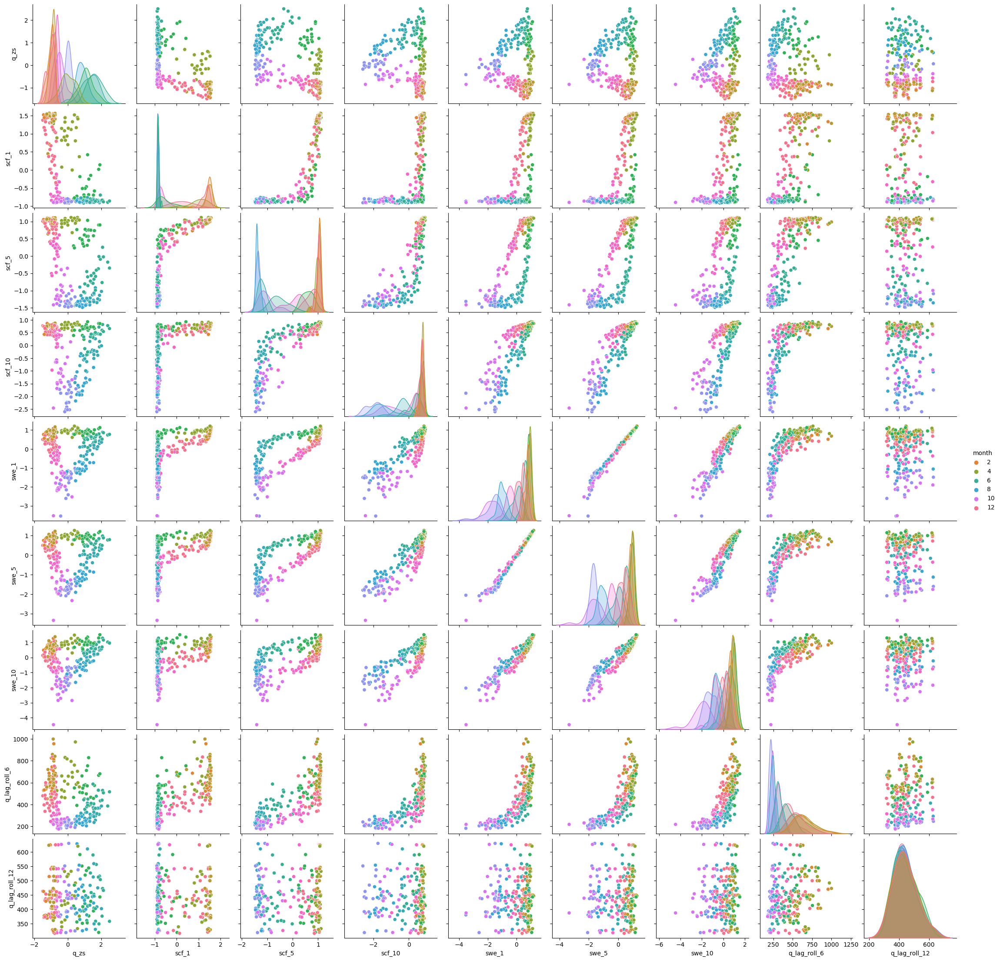

In [35]:
sns.pairplot(prep_data, vars=['q_zs', 'scf_1', 'scf_5', 'scf_10', 'swe_1', 'swe_5', 'swe_10', 'q_lag_roll_6', 'q_lag_roll_12'], diag_kind='kde', hue='month', palette='husl')   

## 3.4 Further Relevant EDA Stuff
EDA with correlation analysis as provided by pycaret.

### 3.4.1 ACF and PACF for Time Series Modeling

In [36]:
from pycaret.time_series import TSForecastingExperiment
eda = TSForecastingExperiment()

prep_data_ocean_idx = prep_data.copy()
prep_data_ocean_idx = prep_data_ocean_idx[['q_zs','month','year','index_NAO', 'index_PDO', 'd_q', 'd_d_q']]

eda.setup(data=prep_data_ocean_idx,
                    target='q_zs',
                    fh=6,
                    numeric_imputation_target="ffill", 
                    numeric_imputation_exogenous="ffill",
                    fig_kwargs=global_fig_settings, 
                    session_id=123)
eda

In [37]:
eda.plot_model(plot="diff", 
                fig_kwargs={"height": 1000, "width": 1200},
                data_kwargs={"lags_list": [1, [1, 12]],
                                "acf": True,
                                "pacf": True,
                                "periodogram": True,
    })

The first row above shows raw data, the autocorrelation function, the PACF, and the periodogram. The second row shows the same for the first difference of the data. The third row shows the same for the first difference and the seasonal difference of 12. 

When working with seasonal time series data, taking the first difference is often done to remove the seasonal component and make the data stationary. Stationarity is an important assumption in many time series models because it simplifies the modeling process and allows for more accurate predictions.

The problem with autocorrelation in time series data is that it violates the assumption of independence. Autocorrelation refers to the correlation between observations at different time lags. If there is significant autocorrelation present, it means that the current value of a time series is related to its past values. This can lead to biased parameter estimates and unreliable model predictions.

Next, let us explore cross correlation functions between the target variable and the exogenous variables.

### 3.4.2 Cross Correlation Functions

In [38]:
eda.plot_model(plot="ccf", 
                fig_kwargs={"height": 1000, "width": 1200}
    )

# 4. MODELING

## 4.0 Modeling Helper Functions & Config Files

In [39]:
# Define function that copies dictionary entries to new keys (used for backtransforming zscored predictions)
def copy_dict_entry(dictionary, existing_key, new_key):
    if existing_key in dictionary:
        dictionary[new_key] = dictionary[existing_key]
    else:
        return f"Error: '{existing_key}' not found in the dictionary."

    return dictionary

In [40]:
# function predict_and_plot() that takes the best model, uses it for prediction over a specified time period, does inverse_transform_and_zscore, and plots the results.
def predict_and_plot(best_model, exp, transform_dict):
    # generate predictions on the original dataset
    predictions_zs = exp.predict_model(best_model)
    predictions_zs.rename(columns={'prediction_label':'q_pred'}, inplace=True)
    # add a date column in the dataset
    predictions_zs['date'] = pd.date_range(start='2017-01-01', end = '2022-12-01', freq = 'MS')
    #plot predictions back transformed
    predictions = predictions_zs.copy()
    transform_dict_new_keys = copy_dict_entry(transform_dict, 'q', 'q_pred')
    transform_dict_new_keys = copy_dict_entry(transform_dict, 'q', 'q_zs')
    inverse_transform_and_zscore(predictions, ['q_zs','q_pred'], transform_dict)
    #rename column q_zs to q
    predictions.rename(columns={'q_zs':'q'}, inplace=True)
    
    # return simple plot
    #return px.line(predictions, x='date', y=["q", "q_pred"], template = 'none', title='Inflow Toktogul (16936) and Prediction', labels={'value':'Inflow (m3/s)'})

    # Creating a subplot with two columns
    fig = make_subplots(rows=1, cols=2, subplot_titles=("Time Series Plot", "Scatter Plot"), )

    # Adding the time series plot to the left panel
    fig.add_trace(go.Scatter(x=predictions['date'], y=predictions['q'], name="Actual Observations"), row=1, col=1)
    fig.add_trace(go.Scatter(x=predictions['date'], y=predictions['q_pred'], name="Predicted Series"), row=1, col=1)

    # Adding the scatter plot to the right panel
    fig.add_trace(go.Scatter(x=predictions['q'], y=predictions['q_pred'], mode='markers', name="Scatter Plot"), row=1, col=2)

    # Adding the 1:1 line to the scatter plot
    fig.add_shape(
        type='line',
        x0=predictions['q'].min(),
        y0=predictions['q'].min(),
        x1=predictions['q'].max(),
        y1=predictions['q'].max(),
        line=dict(color='black', dash='dash'),
        row=1,
        col=2
    )

    # Updating layout settings
    fig.update_layout(showlegend=True, width=1300, height=600)

    # Updating layout settings for the left panel
    fig.update_xaxes(title_text="Date", row=1, col=1)
    fig.update_yaxes(title_text="Q (m3/s)", row=1, col=1)

    # Updating layout settings for the right panel
    fig.update_xaxes(title_text="Actual Q (m3/s)", row=1, col=2)
    fig.update_yaxes(title_text="Predicted Q (m3/s)", row=1, col=2)

    # Changing the plot template
    fig.update_layout(template="none")

    # Returning the plot
    return fig 

Here, we define the ignore_feature_list which we can use to easily exclude features from selected models.

In [41]:
# get the column names from prep_data dataframe
prep_data_names = prep_data.columns.to_list()
prep_data_names
# select the columns that contain the string 'scf' and 'swe'
ignore_feature_list = [s for s in prep_data_names if 'scf' in s or 'swe' in s or 'index' in s or 'd_' in s or 'lag' in s]
# concatenate the list of columns with the string 'date
ignore_feature_list = ['date','q', 'series'] + ignore_feature_list
ignore_feature_list

#create a function that takes a list of features to ignore and returns a list of features to use from a base list
def create_feature_list(base_list, ignore_list):
    # this function takes a list of features to ignore and returns a list of features to use from a base list
    feature_list = [x for x in base_list if x not in ignore_list]
    return feature_list

create_feature_list(prep_data_names, ignore_feature_list)


['q_zs', 'month', 'year']

## 4.1 Baseline Models
Here , we are setting up a baseline regression model. We will use this as a benchmark for the more advanced models that we will develop later.

### 4.1.1 Regression Model

setup(): This function initializes the training environment and creates the transformation pipeline. Setup function must be called before executing any other function. It takes two mandatory parameters: data and target. All the other parameters are optional.

A note here on **categorical features**. When including month as a categorical feature, the model performance deteriorates. So we see no value added in doing so but can come back to this later once more when more complex models are used.

In [42]:
# update ignore_feature_list
ignore_feature_list_bl = ignore_feature_list.copy()
create_feature_list(prep_data_names, ignore_feature_list_bl)

['q_zs', 'month', 'year']

In [43]:
from pycaret.regression import RegressionExperiment
reg_exp_bl = RegressionExperiment()
reg_exp_bl.setup(prep_data, 
        target = "q_zs", 
        data_split_shuffle = False, 
        fold_strategy = "timeseries",
        #categorical_features = ['month'],
        ignore_features = ignore_feature_list_bl,
        train_size = 0.7272727272727273, # it just means we have 6 years of data for hold out testing
        transform_target = True,
        session_id = 123,
        log_experiment = False,
        experiment_name = 'reg_exp_bl')

,Description,Value
0,Session id,123
1,Target,q_zs
2,Target type,Regression
3,Original data shape,"(264, 78)"
4,Transformed data shape,"(264, 3)"
5,Transformed train set shape,"(192, 3)"
6,Transformed test set shape,"(72, 3)"
7,Ignore features,75
8,Numeric features,2
9,Rows with missing values,9.8%


In [44]:
reg_exp_bl_best = reg_exp_bl.compare_models()

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,09:22:33
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


In [45]:
reg_exp_bl.pull(reg_exp_bl_best)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ada,AdaBoost Regressor,0.2901,0.1430,0.3623,0.8562,0.1859,0.9595,0.013
catboost,CatBoost Regressor,0.3172,0.1608,0.3867,0.8356,0.1980,0.8536,0.037
gbr,Gradient Boosting Regressor,0.3062,0.1604,0.3772,0.8277,0.1799,0.9188,0.014
rf,Random Forest Regressor,0.3226,0.1693,0.3890,0.8188,0.1898,0.9274,0.022
xgboost,Extreme Gradient Boosting,0.3257,0.1830,0.4062,0.8024,0.1945,1.0221,0.015
et,Extra Trees Regressor,0.3483,0.2023,0.4312,0.7841,0.2151,0.8883,0.020
dt,Decision Tree Regressor,0.3482,0.2038,0.4297,0.7786,0.2097,1.1186,0.011
knn,K Neighbors Regressor,0.3835,0.2314,0.4674,0.7637,0.2406,1.0238,0.013
lightgbm,Light Gradient Boosting Machine,0.5187,0.4303,0.6036,0.5677,0.3136,1.2463,0.041
en,Elastic Net,0.8767,1.0415,1.0179,-0.0811,0.5202,1.1324,0.011


In [46]:
reg_exp_bl.evaluate_model(estimator = reg_exp_bl_best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [47]:
# Test set predictions of baseline model
predict_and_plot(reg_exp_bl_best, reg_exp_bl, transform_dict)


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,0.2232,0.1108,0.3329,0.8754,0.1601,0.7472


### 4.1.2 Time Series Baseline Model
The Time Series Module is a dedicated for forecasting and includes a combination of statistical and regression based models. For regression based models in the time series module, the feature engineering is done automatically. This is a huge advantage as it saves a lot of time and effort in preparing the data for modeling when compared to the traditional regression models.

In [48]:
prep_data_uni = prep_data.copy()
prep_data_uni = prep_data_uni[['date', 'q']]
prep_data_uni.set_index('date', inplace=True)
prep_data_uni.index = prep_data_uni.index.to_period(freq='M') # convert index to period index. PyCaret works best with period indices. See
# https://github.com/pycaret/pycaret/issues/3417#issuecomment-1476394446
prep_data_uni.head()

,q
date,
2001-01,173.0
2001-02,169.0
2001-03,202.0
2001-04,329.0
2001-05,761.0


In [57]:
from pycaret.time_series import TSForecastingExperiment
ts_exp_uni_bl = TSForecastingExperiment()
ts_exp_uni_bl.setup(data=prep_data_uni,
                    target='q',
                    fh=6,
                    numeric_imputation_target="ffill",
                    numeric_imputation_exogenous="ffill", 
                    fig_kwargs=global_fig_settings, 
                    session_id=123,
                    profile=True)
ts_exp_uni_bl

Loading profile... Please Wait!
Profiler Failed. No output to show, continue with modeling.


In [64]:
ts_exp_uni_bl.check_stats()

,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,264.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,439.280082
3,Summary,Statistics,Transformed,Median,,289.0
4,Summary,Statistics,Transformed,Standard Deviation,,306.826243
5,Summary,Statistics,Transformed,Variance,,94142.343292
6,Summary,Statistics,Transformed,Kurtosis,,1.450416
7,Summary,Statistics,Transformed,Skewness,,1.38759
8,Summary,Statistics,Transformed,# Distinct Values,,206.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",1497.431349


In [65]:
# Compare all models
ts_exp_uni_bl_best = ts_exp_uni_bl.compare_models()

In [59]:
ts_exp_uni_bl.pull(ts_exp_uni_bl_best)

""


In [60]:
# plotting insample predictions
fig_kwargs = {"a": "Year", "b": "Discharge (m3/s)"}    

ts_exp_uni_bl.plot_model(ts_exp_uni_bl_best, plot="insample", fig_kwargs=fig_kwargs)

In [61]:
# plotting out of sample predictions
ts_exp_uni_bl.plot_model(ts_exp_uni_bl_best)

ValueError: No objects to concatenate

## 4.2 Regression Experiments

### 4.2.1 Baseline Model with Long Lag Features
First, we update the ignore_features list to include the long lag features in the model. Then, we run the model.

In [ ]:
# update ignore_feature_list
ignore_feature_list_long_lag = ignore_feature_list.copy()
ignore_feature_list_long_lag.remove('series')
ignore_feature_list_long_lag.remove('q_lag_roll_6')
ignore_feature_list_long_lag.remove('q_lag_roll_12')
create_feature_list(prep_data_names, ignore_feature_list_long_lag)

['q_zs', 'month', 'year', 'series', 'q_lag_roll_12', 'q_lag_roll_6']

In [ ]:
# setup long lag model
from pycaret.regression import RegressionExperiment
reg_exp_long_lag = RegressionExperiment()
reg_exp_long_lag.setup(prep_data, 
        target = "q_zs", 
        data_split_shuffle = False, 
        fold_strategy = "timeseries",
        #categorical_features = ['month'],
        ignore_features = ignore_feature_list_long_lag,
        train_size = 0.7272727272727273, # it just means we have 6 years of data for hold out testing
        transform_target = True,
        session_id = 123,
        log_experiment = False,
        experiment_name = 'reg_exp_bl')

,Description,Value
0,Session id,123
1,Target,q_zs
2,Target type,Regression
3,Original data shape,"(264, 78)"
4,Transformed data shape,"(264, 6)"
5,Transformed train set shape,"(192, 6)"
6,Transformed test set shape,"(72, 6)"
7,Ignore features,72
8,Numeric features,5
9,Rows with missing values,9.8%


In [ ]:
reg_exp_long_lag_best = reg_exp_long_lag.compare_models()

In [ ]:
reg_exp_long_lag.pull(reg_exp_long_lag_best)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ada,AdaBoost Regressor,0.2956,0.1429,0.3650,0.8549,0.1866,0.8773,0.013
rf,Random Forest Regressor,0.3055,0.1492,0.3722,0.8448,0.1856,1.1209,0.019
gbr,Gradient Boosting Regressor,0.3077,0.1536,0.3789,0.8406,0.1908,0.9736,0.013
xgboost,Extreme Gradient Boosting,0.3119,0.1561,0.3789,0.8283,0.1853,1.0105,0.011
catboost,CatBoost Regressor,0.3344,0.1749,0.4033,0.8261,0.2072,0.8824,0.031
et,Extra Trees Regressor,0.3369,0.1733,0.4075,0.8228,0.2070,0.8886,0.018
dt,Decision Tree Regressor,0.4086,0.2858,0.5051,0.7007,0.2374,1.3749,0.010
lightgbm,Light Gradient Boosting Machine,0.5252,0.4436,0.6132,0.5587,0.3213,1.2758,0.018
omp,Orthogonal Matching Pursuit,0.8461,1.0196,1.0062,-0.0562,0.4875,1.4082,0.011
br,Bayesian Ridge,0.8362,1.0260,1.0086,-0.0613,0.4809,1.2801,0.012


In [ ]:
reg_exp_long_lag.evaluate_model(reg_exp_long_lag_best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
predict_and_plot(reg_exp_long_lag_best, reg_exp_long_lag, transform_dict)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,0.2545,0.1151,0.3393,0.8705,0.1605,0.4365


In [ ]:
reg_exp_long_lag_best_tuned = reg_exp_long_lag.tune_model(reg_exp_long_lag_best, optimize='MAE')

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
predict_and_plot(reg_exp_long_lag_best_tuned, reg_exp_long_lag, transform_dict)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,0.2545,0.1151,0.3393,0.8705,0.1605,0.4365


## 4.3 Time Series Experiments

### 4.3.1 Time Series Model with Long Lag Features

We have here as external regressors month, year, q_lag_roll_6, and q_lag_roll_12 when in true forecasting mode which we can grab from the future_df dataframe. so we do not need to make any predictor predictions here.

#### Model Setup

In [ ]:
prep_data_ts_llag = prep_data.copy()
#prep_data_ts_llag = prep_data_ts_llag[['date', 'q_zs', 'month', 'year', 'q_lag_roll_6', 'q_lag_roll_12']]
#prep_data_ts_llag.set_index('date', inplace=True)
prep_data_ts_llag = prep_data_ts_llag[['q', 'month', 'year', 'q_lag_roll_6', 'q_lag_roll_12']]
#prep_data_ts_llag.set_index('date', inplace=True)
prep_data_ts_llag.head()

,q,month,year,q_lag_roll_6,q_lag_roll_12
0,173.0,1,2001,NaN,NaN
1,169.0,2,2001,NaN,NaN
2,202.0,3,2001,NaN,NaN
3,329.0,4,2001,NaN,NaN
4,761.0,5,2001,NaN,NaN


In [ ]:
prep_data_ts_llag = prep_data.copy()
prep_data_ts_llag = prep_data_ts_llag[['date', 'q', 'month', 'year', 'q_lag_roll_6', 'q_lag_roll_12']]
prep_data_ts_llag.set_index('date', inplace=True)
prep_data_ts_llag.index = prep_data_ts_llag.index.to_period(freq='M') # convert index to period index. PyCaret works best with period indices. See
# https://github.com/pycaret/pycaret/issues/3417#issuecomment-1476394446
prep_data_ts_llag.head()

,q,month,year,q_lag_roll_6,q_lag_roll_12
date,,,,,
2001-01,173.0,1,2001,NaN,NaN
2001-02,169.0,2,2001,NaN,NaN
2001-03,202.0,3,2001,NaN,NaN
2001-04,329.0,4,2001,NaN,NaN
2001-05,761.0,5,2001,NaN,NaN


In [ ]:
future_data_ts_llag = future_data[['date', 'month', 'year', 'q_lag_roll_6', 'q_lag_roll_12']].head(6).copy()
future_data_ts_llag.set_index('date', inplace=True)
future_data_ts_llag.index = future_data_ts_llag.index.to_period(freq='M')
future_data_ts_llag


,month,year,q_lag_roll_6,q_lag_roll_12
date,,,,
2023-01,1,2023,617.833333,388.750000
2023-02,2,2023,676.833333,389.166667
2023-03,3,2023,700.666667,390.333333
2023-04,4,2023,648.833333,412.416667
2023-05,5,2023,533.000000,419.833333
2023-06,6,2023,403.166667,440.583333


In [ ]:
from pycaret.time_series import TSForecastingExperiment
ts_exp_llag = TSForecastingExperiment()
ts_exp_llag.setup(data = prep_data_ts_llag,
                    target = 'q',
                    fh = 6,
                    numeric_imputation_target = "ffill",
                    numeric_imputation_exogenous = "ffill", 
                    fig_kwargs = global_fig_settings, 
                    session_id = 123,
                    profile = True,
                    experiment_name = 'ts_exp_llag')

Loading profile... Please Wait!


In [ ]:
ts_exp_llag.pull()

,Description,Value
0,session_id,123
1,Target,q
2,Approach,Univariate
3,Exogenous Variables,Present
4,Original data shape,"(264, 5)"
5,Transformed data shape,"(264, 5)"
6,Transformed train set shape,"(258, 5)"
7,Transformed test set shape,"(6, 5)"
8,Rows with missing values,8.7%
9,Fold Generator,ExpandingWindowSplitter


In [ ]:
ts_exp_llag_best = ts_exp_llag.compare_models()

In [ ]:
ts_exp_llag.pull(ts_exp_llag_best)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detren...,0.6854,0.5701,64.6469,93.2832,0.1339,0.1394,0.8746,0.4467
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,0.6882,0.5659,64.8954,92.583,0.1312,0.1375,0.8777,0.0500
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,0.7278,0.6216,68.6212,101.707,0.1333,0.1339,0.8558,0.0900
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseaso...,0.7281,0.58,68.6527,94.8765,0.1447,0.1554,0.8709,0.0467
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,0.7281,0.58,68.6526,94.8763,0.1447,0.1554,0.8709,0.0467
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,0.7287,0.5801,68.7165,94.8931,0.145,0.1557,0.8708,0.1033
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,0.7325,0.581,69.0674,95.0384,0.1464,0.1574,0.8705,0.0500
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,0.7325,0.581,69.0662,95.0378,0.1464,0.1574,0.8705,0.0467
omp_cds_dt,Orthogonal Matching Pursuit w/ Cond. Deseasona...,0.7462,0.6063,70.3581,99.1988,0.1473,0.154,0.862,0.0467
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize...,0.7828,0.5876,73.8025,96.162,0.1824,0.1976,0.87,0.0533


In [ ]:
ts_exp_llag.plot_model(ts_exp_llag_best, plot="train_test_split", fig_kwargs=fig_kwargs)

In [ ]:
ts_exp_llag_best_tuned = ts_exp_llag.tune_model(ts_exp_llag_best)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    0.7s finished


In [ ]:
ts_exp_llag.plot_model(ts_exp_llag_best_tuned)

In [ ]:
# finalize model. Model finalization retrains the model on the entire set of data.
final_ts_exp_llag = ts_exp_llag.finalize_model(ts_exp_llag_best_tuned)
final_ts_exp_llag

ForecastingPipeline(steps=[('transformer_exogenous',
                            TransformerPipeline(steps=[('numerical_imputer',
                                                        Imputer(method='ffill',
                                                                random_state=123))])),
                           ('forecaster',
                            TransformedTargetForecaster(steps=[('transformer_target',
                                                                TransformerPipeline(steps=[('numerical_imputer',
                                                                                            Imputer(method='ffill',
                                                                                                    random_state=123))])),
                                                               ('model',
                                                                BaseCdsDtForecaster(fe_target_rr=[WindowSummarizer(lag_feature={'lag': [12,
                                                                                                                                        11,
                                                                                                                                        10,
                                                                                                                                        9,
                                                                                                                                        8,
                                                                                                                                        7,
                                                                                                                                        6,
                                                                                                                                        5,
                                                                                                                                        4,
                                                                                                                                        3,
                                                                                                                                        2,
                                                                                                                                        1]},
                                                                                                                   n_jobs=1)],
                                                                                    regressor=BayesianRidge(alpha_1=2.5583491834921515e-07,
                                                                                                            alpha_2=0.0007811241491018094,
                                                                                                            fit_intercept=False,
                                                                                                            lambda_1=4.764729145527039e-08,
                                                                                                            lambda_2=3.6938492594950892e-06),
                                                                                    sp=12,
                                                                                    window_length=15))]))])

In [ ]:
def safe_predict(exp, model):
    """Prediction wrapper for demo purposes."""
    try: 
        exp.predict_model(model)
    except ValueError as exception:
        print(exception)
        exo_vars = exp.exogenous_variables
        print(f"{len(exo_vars)} exogenous variables (X) needed in order to make future predictions:\n{exo_vars}")

safe_predict(ts_exp_llag, final_ts_exp_llag)

Model was trained with exogenous variables but you have not passed any for predictions. Please pass exogenous variables to make predictions.
4 exogenous variables (X) needed in order to make future predictions:
['month', 'year', 'q_lag_roll_6', 'q_lag_roll_12']


In this model, we can easily get the year and month data pair from the future dates. Second, we can get the long lagged values of the target variable from the future_df dataframe. We can then use these as external regressors in the model. We pass these external regressors data as X to the predict_model() function.

In [ ]:
ts_exp_llag.predict_model(final_ts_exp_llag, fh=6, X = future_data_ts_llag)

,y_pred
2023-01,209.4329
2023-02,208.1229
2023-03,232.5965
2023-04,424.0898
2023-05,760.4672
2023-06,1038.4196


### In-Sample Predictions with MultiSteps

This so far does not seem to work as the algorithm for whatever reason does not take the test set passed in the predict_model() function. We need to find out why....

In [ ]:
prep_data_ts_llag

,q,month,year,q_lag_roll_6,q_lag_roll_12
date,,,,,
2001-01,173.0,1,2001,NaN,NaN
2001-02,169.0,2,2001,NaN,NaN
2001-03,202.0,3,2001,NaN,NaN
2001-04,329.0,4,2001,NaN,NaN
2001-05,761.0,5,2001,NaN,NaN
...,...,...,...,...,...
2022-08,556.0,8,2022,228.166667,397.916667
2022-09,356.0,9,2022,207.000000,392.000000
2022-10,240.0,10,2022,263.666667,389.750000


In [ ]:
# Rolling origin performance evaluation of the final model

# First, create a sequence of forecasts using the rolling origin method
# We will use a 6-month forecast horizon.

# create loop to generate rolling origin predictions
rolling_origin_predictions = []
for i in range(30, 40): #len(prep_data_ts_llag)-6
    test = prep_data_ts_llag.iloc[i:i+6]
    # delete rows with missing values
    test.dropna(inplace=True)
    # delete q_zs column from test dataframe
    #test.drop('q_zs', axis=1, inplace=True)
    print(test)
    predictions = ts_exp_llag.predict_model(final_ts_exp_llag, X = test, fh=6) # if fh is not specified, same as in training will be used (fh=6 here).
    rolling_origin_predictions.append(predictions)

                   q  month  year  q_lag_roll_6  q_lag_roll_12
date                                                          
2003-07  1163.000000      7  2003    368.833333     515.500000
2003-08   725.384948      8  2003    266.166667     536.000000
2003-09   525.294782      9  2003    234.000000     537.583333
2003-10   301.244591     10  2003    234.000000     540.416667
2003-11   251.547220     11  2003    316.166667     541.416667
2003-12   220.482467     12  2003    495.333333     543.833333
                  q  month  year  q_lag_roll_6  q_lag_roll_12
date                                                         
2003-08  725.384948      8  2003    266.166667     536.000000
2003-09  525.294782      9  2003    234.000000     537.583333
2003-10  301.244591     10  2003    234.000000     540.416667
2003-11  251.547220     11  2003    316.166667     541.416667
2003-12  220.482467     12  2003    495.333333     543.833333
2004-01  203.987536      1  2004    656.166667     544.500000


In [ ]:
rolling_origin_predictions

[            y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             y_pred
 2023-01   196.6662
 2023-02   188.4312
 2023-03   208.7763
 2023-04   402.8932
 2023-05   742.6614
 2023-06  1027.4322,
             

In [ ]:
# first 6 list entries
rolling_origin_predictions[1]

,y_pred
2023-01,196.6662
2023-02,188.4312
2023-03,208.7763
2023-04,402.8932
2023-05,742.6614
2023-06,1027.4322


In [ ]:
# last six list entries
rolling_origin_predictions[-1]

,y_pred
2023-01,196.6662
2023-02,188.4312
2023-03,208.7763
2023-04,402.8932
2023-05,742.6614
2023-06,1027.4322


#### Make Future Predictions

The exogenous variable are 'month', 'year', q_lag_roll_6', and 'q_lag_roll_12'. We need to make future predictions for these variables.

In [ ]:
exog_vars = prep_data.copy()
exog_vars = exog_vars[['month', 'year', 'q_lag_roll_6', 'q_lag_roll_12']]
exog_vars.tail()

,month,year,q_lag_roll_6,q_lag_roll_12
259,8,2022,228.166667,397.916667
260,9,2022,207.000000,392.000000
261,10,2022,263.666667,389.750000
262,11,2022,383.500000,389.083333
263,12,2022,515.833333,388.500000


In [ ]:
# Get future values of exogenous variables via forecasting
# Step 1: Train models for exog variables ----
exog_exps = []
exog_models = []
for exog_var in exog_vars:
    exog_exp = TSForecastingExperiment()
    exog_exp.setup(
        data = prep_data[exog_var], fh = 6,
        numeric_imputation_target = "ffill", numeric_imputation_exogenous = "ffill",
        fig_kwargs = global_fig_settings, session_id = 123
    )

    # Users can customize how to model future exogenous variables i.e. add
    # more steps and models to potentially get better models at the expense
    # of higher modeling time.
    best = exog_exp.compare_models(
        sort="mase", include=["arima", "ets", "exp_smooth", "theta", "lightgbm_cds_dt"]        
    )
    final_exog_model = exog_exp.finalize_model(best)

    exog_exps.append(exog_exp)
    exog_models.append(final_exog_model)

,Description,Value
0,session_id,123
1,Target,q_lag_roll_6
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(264, 1)"
5,Transformed data shape,"(264, 1)"
6,Transformed train set shape,"(258, 1)"
7,Transformed test set shape,"(6, 1)"
8,Rows with missing values,4.2%
9,Fold Generator,ExpandingWindowSplitter


In [ ]:
# Step 2: Get future predictions for exog variables ----
future_exog = [
    exog_exp.predict_model(exog_model)
    for exog_exp, exog_model in zip(exog_exps, exog_models)
]
future_exog = pd.concat(future_exog, axis=1)
# rename columns of future_exog dataframe to match the names of the exog_vars dataframe
future_exog.columns = exog_vars.columns
#future_exog.columns = exog_vars
future_exog

,month,year,q_lag_roll_6,q_lag_roll_12
264,1.0,2023.0100,640.2716,387.5877
265,2.0,2023.0022,719.4377,386.3704
266,3.0,2023.0019,752.8401,385.4572
267,4.0,2023.0016,738.5336,384.2408
268,5.0,2023.0013,648.9361,383.3267
269,6.0,2023.0009,496.6334,382.1112


In [ ]:
exp_future = TSForecastingExperiment()
final_slim_model = exp_future.load_model(ts_exp_uni_bl_final)

NameError: name 'ts_exp_uni_bl_final' is not defined

# Scratchpad

In [ ]:
from pycaret.time_series import TSForecastingExperiment
ts_exp_llag = TSForecastingExperiment()
ts_exp_llag.setup(data = prep_data_ts_llag,
                    target = 'q',
                    fh = 6,
                    numeric_imputation_target = "ffill",
                    numeric_imputation_exogenous = "ffill", 
                    fig_kwargs = global_fig_settings, 
                    session_id = 123,
                    profile = True,
                    experiment_name = 'ts_exp_llag')

ts_exp_prophet_llag = ts_exp_llag.create_model('prophet')      

NameError: name 'prep_data_ts_llag' is not defined